In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
def patch_together_nearest(G, position):
    list_of_all_nodes = np.array(range(G.numberOfNodes()))
    
    cc = nk.components.ConnectedComponents(G)
    cc.run()
    components = cc.getComponents()
    number_of_components = cc.numberOfComponents()
    
    bridges = 1
    
    while number_of_components != 1:

            

        compA = np.array(components[0])
        compB = np.delete(list_of_all_nodes, compA)


        pointsA = position[compA]
        pointsB = position[compB]
        
        diff = pairwise_distances(pointsA, pointsB, n_jobs=-1)

        top_bridges = np.argpartition(diff.flatten(), bridges)[0:bridges]
        indices = np.unravel_index(top_bridges, diff.shape)
        nodesA = compA[indices[0]]
        nodesB = compB[indices[1]]

        for i in range(bridges):
            try:
                nodeA = nodesA[i]
                nodeB = nodesB[i]
            except:
                print(nodesA, nodesB, indices, top_bridges, compA, compB)
                raise RuntimeError("Bug somewhere")
            distance = norm(position[nodeA] - position[nodeB])
            if not G.hasEdge(nodeA, nodeB):
                G.addEdge(nodeA, nodeB, distance)

                    
        cc = nk.components.ConnectedComponents(G)
        cc.run()
        components = cc.getComponents()
        number_of_components = cc.numberOfComponents()
        
    return G

In [6]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "eth_CC"

threshold = 6

# for the filename
parameters = "2-0_5"

In [7]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)
    
    
################################
###   apply the fitltering   ###
################################
from cluster_filter import cfilter
number_of_nodes = len(position)
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))

cluster_centers, labels, position, pca, embedding = cfilter(*k_means_pp(k, pca, return_labels=True), position, pca, embedding)
number_of_nodes = len(pca)
################################


unique_labels = np.unique(labels)

print("Time for data preperation: ", time.time()-start)

sklearn is done: 11.779983520507812
My own part is done: 1.127094030380249
Time for data preperation:  66.89754557609558


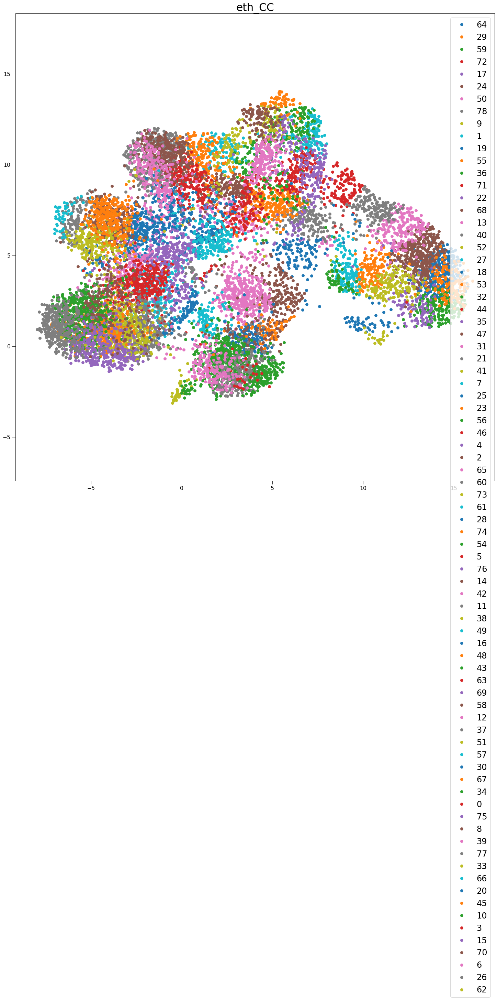

In [8]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
plt.show()

In [9]:
np.argsort([1,2,36])

0 not in [1,2,3]

True

In [10]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=4,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/76 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/345 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1237 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1237 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1237 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/344 [00:00<?, ?it/s]

update Arr 1237 -> 1119
added 6 edges early
update Arr 1119 -> 1007
added 2 edges early
update Arr 1007 -> 914
added 5 edges early
update Arr 914 -> 829
added 5 edges early
update Arr 829 -> 753
update Arr 753 -> 683
update Arr 683 -> 619
update Arr 619 -> 560
update Arr 560 -> 509
update Arr 509 -> 461
update Arr 461 -> 417
update Arr 417 -> 379
update Arr 379 -> 354
added 3 edges early
update Arr 354 -> 354
update Arr 354 -> 353
update Arr 353 -> 353
update Arr 353 -> 346
added 4 edges early
update Arr 346 -> 346
update Arr 346 -> 345
update Arr 345 -> 345


calculating the densities for the density criterion:   0%|          | 0/128 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/477 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/477 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/477 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/127 [00:00<?, ?it/s]

update Arr 477 -> 427
added 2 edges early
update Arr 427 -> 382
update Arr 382 -> 344
update Arr 344 -> 306
added 2 edges early
update Arr 306 -> 269
update Arr 269 -> 243
update Arr 243 -> 220
update Arr 220 -> 199
update Arr 199 -> 180
update Arr 180 -> 162
update Arr 162 -> 147
update Arr 147 -> 137
update Arr 137 -> 130
added 4 edges early
update Arr 130 -> 130
update Arr 130 -> 129
update Arr 129 -> 128


calculating the densities for the density criterion:   0%|          | 0/298 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1089 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1089 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1089 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/297 [00:00<?, ?it/s]

update Arr 1089 -> 974
added 2 edges early
update Arr 974 -> 885
update Arr 885 -> 802
added 2 edges early
update Arr 802 -> 726
added 2 edges early
update Arr 726 -> 659
update Arr 659 -> 599
update Arr 599 -> 544
update Arr 544 -> 493
update Arr 493 -> 445
update Arr 445 -> 404
update Arr 404 -> 366
update Arr 366 -> 332
update Arr 332 -> 306
added 2 edges early
update Arr 306 -> 306
update Arr 306 -> 306
update Arr 306 -> 303
update Arr 303 -> 303
update Arr 303 -> 299
update Arr 299 -> 299
update Arr 299 -> 298


calculating the densities for the density criterion:   0%|          | 0/27 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/92 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/92 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/92 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/26 [00:00<?, ?it/s]

update Arr 92 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 59
update Arr 59 -> 51
update Arr 51 -> 45
update Arr 45 -> 33
update Arr 33 -> 33
update Arr 33 -> 32
update Arr 32 -> 31
update Arr 31 -> 30
update Arr 30 -> 28
update Arr 28 -> 27


calculating the densities for the density criterion:   0%|          | 0/128 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/443 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/443 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/443 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/127 [00:00<?, ?it/s]

update Arr 443 -> 397
update Arr 397 -> 360
update Arr 360 -> 327
added 3 edges early
update Arr 327 -> 296
update Arr 296 -> 268
update Arr 268 -> 243
update Arr 243 -> 220
update Arr 220 -> 198
update Arr 198 -> 179
update Arr 179 -> 161
update Arr 161 -> 146
update Arr 146 -> 136
update Arr 136 -> 134
update Arr 134 -> 132
update Arr 132 -> 129
update Arr 129 -> 129
update Arr 129 -> 128
update Arr 128 -> 128


calculating the densities for the density criterion:   0%|          | 0/136 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/484 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/484 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/484 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/135 [00:00<?, ?it/s]

update Arr 484 -> 436
added 2 edges early
update Arr 436 -> 396
update Arr 396 -> 356
update Arr 356 -> 323
update Arr 323 -> 292
update Arr 292 -> 263
update Arr 263 -> 239
update Arr 239 -> 217
update Arr 217 -> 196
update Arr 196 -> 177
update Arr 177 -> 160
update Arr 160 -> 141
update Arr 141 -> 141
update Arr 141 -> 140
update Arr 140 -> 137
update Arr 137 -> 137
update Arr 137 -> 135


calculating the densities for the density criterion:   0%|          | 0/187 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/686 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/686 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/686 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/186 [00:00<?, ?it/s]

update Arr 686 -> 623
added 4 edges early
update Arr 623 -> 564
update Arr 564 -> 509
update Arr 509 -> 454
update Arr 454 -> 412
update Arr 412 -> 372
update Arr 372 -> 338
update Arr 338 -> 306
update Arr 306 -> 277
update Arr 277 -> 249
update Arr 249 -> 224
update Arr 224 -> 202
update Arr 202 -> 196
update Arr 196 -> 196
update Arr 196 -> 193
update Arr 193 -> 189
added 3 edges early
update Arr 189 -> 189
update Arr 189 -> 188
update Arr 188 -> 187


calculating the densities for the density criterion:   0%|          | 0/121 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/416 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/416 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/416 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/120 [00:00<?, ?it/s]

update Arr 416 -> 376
added 2 edges early
update Arr 376 -> 341
update Arr 341 -> 301
update Arr 301 -> 273
update Arr 273 -> 247
update Arr 247 -> 223
update Arr 223 -> 199
update Arr 199 -> 180
update Arr 180 -> 162
update Arr 162 -> 146
update Arr 146 -> 131
update Arr 131 -> 129
update Arr 129 -> 128
update Arr 128 -> 127
update Arr 127 -> 126
update Arr 126 -> 125
update Arr 125 -> 124
update Arr 124 -> 122
update Arr 122 -> 122
update Arr 122 -> 121


calculating the densities for the density criterion:   0%|          | 0/100 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/342 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/342 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/342 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/99 [00:00<?, ?it/s]

update Arr 342 -> 305
added 2 edges early
update Arr 305 -> 274
update Arr 274 -> 245
update Arr 245 -> 222
update Arr 222 -> 200
update Arr 200 -> 180
update Arr 180 -> 163
update Arr 163 -> 144
update Arr 144 -> 129
update Arr 129 -> 117
update Arr 117 -> 109
update Arr 109 -> 107
update Arr 107 -> 104
update Arr 104 -> 104
update Arr 104 -> 103
update Arr 103 -> 102
update Arr 102 -> 101
update Arr 101 -> 100


calculating the densities for the density criterion:   0%|          | 0/159 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/591 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/591 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/591 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/158 [00:00<?, ?it/s]

update Arr 591 -> 536
added 3 edges early
update Arr 536 -> 480
update Arr 480 -> 432
update Arr 432 -> 391
update Arr 391 -> 354
update Arr 354 -> 320
update Arr 320 -> 290
update Arr 290 -> 263
update Arr 263 -> 239
update Arr 239 -> 214
update Arr 214 -> 193
update Arr 193 -> 175
update Arr 175 -> 164
update Arr 164 -> 164
update Arr 164 -> 163
update Arr 163 -> 162
update Arr 162 -> 161
update Arr 161 -> 160
update Arr 160 -> 159


calculating the densities for the density criterion:   0%|          | 0/480 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1794 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1794 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1794 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/479 [00:00<?, ?it/s]

update Arr 1794 -> 1628
added 6 edges early
update Arr 1628 -> 1478
update Arr 1478 -> 1343
added 6 edges early
update Arr 1343 -> 1215
added 2 edges early
update Arr 1215 -> 1103
update Arr 1103 -> 1001
update Arr 1001 -> 907
update Arr 907 -> 824
update Arr 824 -> 749
update Arr 749 -> 680
update Arr 680 -> 618
update Arr 618 -> 560
update Arr 560 -> 509
update Arr 509 -> 488
added 2 edges early
update Arr 488 -> 488
update Arr 488 -> 487
update Arr 487 -> 486
update Arr 486 -> 484
update Arr 484 -> 483
update Arr 483 -> 482
update Arr 482 -> 481
update Arr 481 -> 480


calculating the densities for the density criterion:   0%|          | 0/137 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/487 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/487 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/487 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/136 [00:00<?, ?it/s]

update Arr 487 -> 437
added 3 edges early
update Arr 437 -> 397
update Arr 397 -> 358
update Arr 358 -> 323
added 2 edges early
update Arr 323 -> 292
update Arr 292 -> 265
update Arr 265 -> 238
update Arr 238 -> 216
update Arr 216 -> 194
update Arr 194 -> 175
update Arr 175 -> 159
update Arr 159 -> 143
update Arr 143 -> 143
update Arr 143 -> 140
update Arr 140 -> 140
update Arr 140 -> 138
update Arr 138 -> 138
update Arr 138 -> 137


calculating the densities for the density criterion:   0%|          | 0/204 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/745 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/745 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/745 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/203 [00:00<?, ?it/s]

update Arr 745 -> 674
added 3 edges early
update Arr 674 -> 612
update Arr 612 -> 552
update Arr 552 -> 491
update Arr 491 -> 446
update Arr 446 -> 405
update Arr 405 -> 368
update Arr 368 -> 334
update Arr 334 -> 303
update Arr 303 -> 275
update Arr 275 -> 249
update Arr 249 -> 226
update Arr 226 -> 213
update Arr 213 -> 212
update Arr 212 -> 210
update Arr 210 -> 207
added 2 edges early
update Arr 207 -> 207
update Arr 207 -> 206
update Arr 206 -> 205
update Arr 205 -> 204


calculating the densities for the density criterion:   0%|          | 0/110 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/374 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/374 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/374 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/109 [00:00<?, ?it/s]

update Arr 374 -> 334
update Arr 334 -> 303
update Arr 303 -> 274
update Arr 274 -> 248
update Arr 248 -> 225
update Arr 225 -> 203
update Arr 203 -> 183
update Arr 183 -> 165
update Arr 165 -> 147
update Arr 147 -> 132
update Arr 132 -> 119
update Arr 119 -> 119
update Arr 119 -> 118
update Arr 118 -> 116
update Arr 116 -> 115
update Arr 115 -> 113
update Arr 113 -> 111
update Arr 111 -> 110


calculating the densities for the density criterion:   0%|          | 0/74 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/257 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/257 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/257 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/73 [00:00<?, ?it/s]

update Arr 257 -> 228
update Arr 228 -> 207
update Arr 207 -> 188
update Arr 188 -> 170
update Arr 170 -> 153
update Arr 153 -> 138
update Arr 138 -> 124
update Arr 124 -> 112
update Arr 112 -> 101
update Arr 101 -> 91
update Arr 91 -> 83
update Arr 83 -> 82
update Arr 82 -> 77
update Arr 77 -> 76
update Arr 76 -> 75
update Arr 75 -> 75
update Arr 75 -> 74
update Arr 74 -> 74


calculating the densities for the density criterion:   0%|          | 0/374 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1418 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1418 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1418 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/373 [00:00<?, ?it/s]

update Arr 1418 -> 1257
added 13 edges early
update Arr 1257 -> 1142
added 4 edges early
update Arr 1142 -> 1037
update Arr 1037 -> 940
update Arr 940 -> 853
update Arr 853 -> 773
update Arr 773 -> 702
update Arr 702 -> 638
update Arr 638 -> 579
update Arr 579 -> 525
update Arr 525 -> 477
update Arr 477 -> 430
update Arr 430 -> 390
update Arr 390 -> 383
update Arr 383 -> 375
added 4 edges early
update Arr 375 -> 375
update Arr 375 -> 374


calculating the densities for the density criterion:   0%|          | 0/280 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1033 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1033 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1033 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/279 [00:00<?, ?it/s]

update Arr 1033 -> 939
added 5 edges early
update Arr 939 -> 847
added 4 edges early
update Arr 847 -> 769
added 3 edges early
update Arr 769 -> 699
update Arr 699 -> 635
update Arr 635 -> 575
update Arr 575 -> 520
update Arr 520 -> 471
update Arr 471 -> 428
update Arr 428 -> 389
update Arr 389 -> 353
update Arr 353 -> 317
update Arr 317 -> 288
update Arr 288 -> 287
update Arr 287 -> 286
update Arr 286 -> 281
added 4 edges early
update Arr 281 -> 281
update Arr 281 -> 280


calculating the densities for the density criterion:   0%|          | 0/115 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/413 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/413 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/413 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/114 [00:00<?, ?it/s]

update Arr 413 -> 363
added 3 edges early
update Arr 363 -> 329
update Arr 329 -> 295
update Arr 295 -> 267
update Arr 267 -> 241
update Arr 241 -> 217
update Arr 217 -> 196
update Arr 196 -> 176
update Arr 176 -> 158
update Arr 158 -> 142
update Arr 142 -> 128
update Arr 128 -> 124
update Arr 124 -> 116
added 7 edges early
update Arr 116 -> 116
update Arr 116 -> 115


calculating the densities for the density criterion:   0%|          | 0/106 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/355 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/355 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/355 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/105 [00:00<?, ?it/s]

update Arr 355 -> 321
added 3 edges early
update Arr 321 -> 290
update Arr 290 -> 262
update Arr 262 -> 238
update Arr 238 -> 215
update Arr 215 -> 193
update Arr 193 -> 175
update Arr 175 -> 158
update Arr 158 -> 142
update Arr 142 -> 129
update Arr 129 -> 116
update Arr 116 -> 115
update Arr 115 -> 112
update Arr 112 -> 108
update Arr 108 -> 108
update Arr 108 -> 106
update Arr 106 -> 106


calculating the densities for the density criterion:   0%|          | 0/61 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/211 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/211 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/211 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/60 [00:00<?, ?it/s]

update Arr 211 -> 189
update Arr 189 -> 170
update Arr 170 -> 152
update Arr 152 -> 138
update Arr 138 -> 123
update Arr 123 -> 110
update Arr 110 -> 99
update Arr 99 -> 85
update Arr 85 -> 77
update Arr 77 -> 68
update Arr 68 -> 68
update Arr 68 -> 67
update Arr 67 -> 65
update Arr 65 -> 64
update Arr 64 -> 62
update Arr 62 -> 61


calculating the densities for the density criterion:   0%|          | 0/72 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/251 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/251 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/251 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/71 [00:00<?, ?it/s]

update Arr 251 -> 226
update Arr 226 -> 203
update Arr 203 -> 180
update Arr 180 -> 163
update Arr 163 -> 148
update Arr 148 -> 134
update Arr 134 -> 120
update Arr 120 -> 109
update Arr 109 -> 96
update Arr 96 -> 87
update Arr 87 -> 81
update Arr 81 -> 75
update Arr 75 -> 75
update Arr 75 -> 74
update Arr 74 -> 73
update Arr 73 -> 72
update Arr 72 -> 72


calculating the densities for the density criterion:   0%|          | 0/323 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1181 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/322 [00:00<?, ?it/s]

update Arr 1181 -> 1066
added 6 edges early
update Arr 1066 -> 964
update Arr 964 -> 876
added 3 edges early
update Arr 876 -> 793
added 2 edges early
update Arr 793 -> 719
update Arr 719 -> 652
update Arr 652 -> 590
update Arr 590 -> 535
update Arr 535 -> 486
update Arr 486 -> 441
update Arr 441 -> 400
update Arr 400 -> 362
update Arr 362 -> 332
update Arr 332 -> 326
added 4 edges early
update Arr 326 -> 326
update Arr 326 -> 325
update Arr 325 -> 324
update Arr 324 -> 323


calculating the densities for the density criterion:   0%|          | 0/177 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/636 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/636 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/636 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/176 [00:00<?, ?it/s]

update Arr 636 -> 574
added 3 edges early
update Arr 574 -> 516
update Arr 516 -> 467
update Arr 467 -> 424
update Arr 424 -> 385
update Arr 385 -> 348
update Arr 348 -> 316
update Arr 316 -> 287
update Arr 287 -> 260
update Arr 260 -> 236
update Arr 236 -> 214
update Arr 214 -> 181
added 6 edges early
update Arr 181 -> 181
update Arr 181 -> 180
update Arr 180 -> 179
update Arr 179 -> 179
update Arr 179 -> 178
update Arr 178 -> 178
update Arr 178 -> 177
update Arr 177 -> 176


calculating the densities for the density criterion:   0%|          | 0/383 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1436 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1436 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1436 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/382 [00:00<?, ?it/s]

update Arr 1436 -> 1304
added 3 edges early
update Arr 1304 -> 1185
added 3 edges early
update Arr 1185 -> 1077
added 6 edges early
update Arr 1077 -> 972
added 3 edges early
update Arr 972 -> 882
update Arr 882 -> 800
update Arr 800 -> 726
update Arr 726 -> 659
update Arr 659 -> 599
update Arr 599 -> 543
update Arr 543 -> 491
update Arr 491 -> 444
update Arr 444 -> 402
update Arr 402 -> 392
update Arr 392 -> 391
update Arr 391 -> 386
added 3 edges early
update Arr 386 -> 386
update Arr 386 -> 384
update Arr 384 -> 384
update Arr 384 -> 383


calculating the densities for the density criterion:   0%|          | 0/142 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/499 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/499 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/499 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/141 [00:00<?, ?it/s]

update Arr 499 -> 449
added 2 edges early
update Arr 449 -> 407
update Arr 407 -> 364
update Arr 364 -> 330
update Arr 330 -> 298
update Arr 298 -> 268
update Arr 268 -> 241
update Arr 241 -> 219
update Arr 219 -> 198
update Arr 198 -> 177
update Arr 177 -> 160
update Arr 160 -> 150
added 2 edges early
update Arr 150 -> 150
update Arr 150 -> 149
update Arr 149 -> 147
update Arr 147 -> 145
update Arr 145 -> 144
update Arr 144 -> 144
update Arr 144 -> 143
update Arr 143 -> 142


calculating the densities for the density criterion:   0%|          | 0/360 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1339 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1339 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1339 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/359 [00:00<?, ?it/s]

update Arr 1339 -> 1204
added 9 edges early
update Arr 1204 -> 1092
update Arr 1092 -> 992
added 2 edges early
update Arr 992 -> 896
update Arr 896 -> 814
update Arr 814 -> 738
update Arr 738 -> 668
update Arr 668 -> 606
update Arr 606 -> 549
update Arr 549 -> 497
update Arr 497 -> 451
update Arr 451 -> 409
update Arr 409 -> 371
update Arr 371 -> 369
update Arr 369 -> 368
update Arr 368 -> 367
update Arr 367 -> 366
update Arr 366 -> 365
update Arr 365 -> 364
update Arr 364 -> 363
update Arr 363 -> 362
update Arr 362 -> 361


calculating the densities for the density criterion:   0%|          | 0/150 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/536 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/536 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/536 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/149 [00:00<?, ?it/s]

update Arr 536 -> 485
added 3 edges early
update Arr 485 -> 435
update Arr 435 -> 394
update Arr 394 -> 351
added 2 edges early
update Arr 351 -> 319
update Arr 319 -> 288
update Arr 288 -> 261
update Arr 261 -> 237
update Arr 237 -> 211
update Arr 211 -> 191
update Arr 191 -> 173
update Arr 173 -> 159
update Arr 159 -> 154
added 2 edges early
update Arr 154 -> 154
update Arr 154 -> 152
update Arr 152 -> 152
update Arr 152 -> 151
update Arr 151 -> 150


calculating the densities for the density criterion:   0%|          | 0/171 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/629 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/629 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/629 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/170 [00:00<?, ?it/s]

update Arr 629 -> 570
added 5 edges early
update Arr 570 -> 508
update Arr 508 -> 458
added 3 edges early
update Arr 458 -> 410
added 2 edges early
update Arr 410 -> 372
update Arr 372 -> 337
update Arr 337 -> 306
update Arr 306 -> 277
update Arr 277 -> 251
update Arr 251 -> 228
update Arr 228 -> 205
update Arr 205 -> 186
update Arr 186 -> 180
update Arr 180 -> 176
update Arr 176 -> 174
update Arr 174 -> 171
update Arr 171 -> 171
update Arr 171 -> 170


calculating the densities for the density criterion:   0%|          | 0/167 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/632 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/632 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/632 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/166 [00:00<?, ?it/s]

update Arr 632 -> 568
added 5 edges early
update Arr 568 -> 505
update Arr 505 -> 457
update Arr 457 -> 415
update Arr 415 -> 368
update Arr 368 -> 334
update Arr 334 -> 303
update Arr 303 -> 274
update Arr 274 -> 249
update Arr 249 -> 226
update Arr 226 -> 203
update Arr 203 -> 184
update Arr 184 -> 176
update Arr 176 -> 175
update Arr 175 -> 172
update Arr 172 -> 171
update Arr 171 -> 170
update Arr 170 -> 169
update Arr 169 -> 168


calculating the densities for the density criterion:   0%|          | 0/131 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/487 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/487 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/487 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/130 [00:00<?, ?it/s]

update Arr 487 -> 435
added 3 edges early
update Arr 435 -> 394
update Arr 394 -> 352
added 2 edges early
update Arr 352 -> 318
update Arr 318 -> 288
update Arr 288 -> 260
update Arr 260 -> 235
update Arr 235 -> 212
update Arr 212 -> 189
update Arr 189 -> 170
update Arr 170 -> 153
update Arr 153 -> 139
update Arr 139 -> 138
update Arr 138 -> 137
update Arr 137 -> 133
update Arr 133 -> 133
update Arr 133 -> 132
update Arr 132 -> 131
update Arr 131 -> 131


calculating the densities for the density criterion:   0%|          | 0/408 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1503 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1503 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1503 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/407 [00:00<?, ?it/s]

update Arr 1503 -> 1362
added 7 edges early
update Arr 1362 -> 1237
update Arr 1237 -> 1124
added 4 edges early
update Arr 1124 -> 1020
added 4 edges early
update Arr 1020 -> 916
added 8 edges early
update Arr 916 -> 832
update Arr 832 -> 756
update Arr 756 -> 686
update Arr 686 -> 623
update Arr 623 -> 566
update Arr 566 -> 514
update Arr 514 -> 467
update Arr 467 -> 423
update Arr 423 -> 416
update Arr 416 -> 415
update Arr 415 -> 412
update Arr 412 -> 412
update Arr 412 -> 411
update Arr 411 -> 411
update Arr 411 -> 410
update Arr 410 -> 409
update Arr 409 -> 408


calculating the densities for the density criterion:   0%|          | 0/111 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/386 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/386 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/386 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/110 [00:00<?, ?it/s]

update Arr 386 -> 348
added 2 edges early
update Arr 348 -> 315
update Arr 315 -> 285
update Arr 285 -> 258
update Arr 258 -> 232
update Arr 232 -> 210
update Arr 210 -> 188
update Arr 188 -> 168
update Arr 168 -> 150
update Arr 150 -> 136
update Arr 136 -> 123
update Arr 123 -> 120
update Arr 120 -> 119
update Arr 119 -> 117
update Arr 117 -> 116
update Arr 116 -> 115
update Arr 115 -> 113
update Arr 113 -> 112


calculating the densities for the density criterion:   0%|          | 0/442 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1663 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1663 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1663 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/441 [00:00<?, ?it/s]

update Arr 1663 -> 1499
added 8 edges early
update Arr 1499 -> 1354
update Arr 1354 -> 1228
added 4 edges early
update Arr 1228 -> 1112
added 6 edges early
update Arr 1112 -> 1010
update Arr 1010 -> 917
update Arr 917 -> 832
update Arr 832 -> 755
update Arr 755 -> 684
update Arr 684 -> 621
update Arr 621 -> 563
update Arr 563 -> 511
update Arr 511 -> 464
update Arr 464 -> 450
update Arr 450 -> 449
update Arr 449 -> 442
added 6 edges early
update Arr 442 -> 442


calculating the densities for the density criterion:   0%|          | 0/153 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/570 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/570 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/570 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/152 [00:00<?, ?it/s]

update Arr 570 -> 518
added 6 edges early
update Arr 518 -> 469
update Arr 469 -> 422
update Arr 422 -> 380
added 2 edges early
update Arr 380 -> 345
update Arr 345 -> 312
update Arr 312 -> 283
update Arr 283 -> 255
update Arr 255 -> 231
update Arr 231 -> 209
update Arr 209 -> 186
update Arr 186 -> 168
update Arr 168 -> 162
update Arr 162 -> 161
update Arr 161 -> 160
update Arr 160 -> 159
update Arr 159 -> 157
update Arr 157 -> 156
update Arr 156 -> 155
update Arr 155 -> 154
update Arr 154 -> 153


calculating the densities for the density criterion:   0%|          | 0/58 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/198 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/198 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/198 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 198 -> 177
update Arr 177 -> 159
update Arr 159 -> 140
update Arr 140 -> 127
update Arr 127 -> 115
update Arr 115 -> 104
update Arr 104 -> 93
update Arr 93 -> 83
update Arr 83 -> 75
update Arr 75 -> 68
update Arr 68 -> 66
update Arr 66 -> 65
update Arr 65 -> 63
update Arr 63 -> 61
update Arr 61 -> 60
update Arr 60 -> 59
update Arr 59 -> 58


calculating the densities for the density criterion:   0%|          | 0/52 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/186 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/186 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/186 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/51 [00:00<?, ?it/s]

update Arr 186 -> 169
update Arr 169 -> 152
update Arr 152 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 98
update Arr 98 -> 88
update Arr 88 -> 78
update Arr 78 -> 68
update Arr 68 -> 61
update Arr 61 -> 59
update Arr 59 -> 53
added 2 edges early
update Arr 53 -> 53
update Arr 53 -> 52
update Arr 52 -> 52


calculating the densities for the density criterion:   0%|          | 0/307 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1147 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1147 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1147 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/306 [00:00<?, ?it/s]

update Arr 1147 -> 1042
added 7 edges early
update Arr 1042 -> 925
update Arr 925 -> 824
added 5 edges early
update Arr 824 -> 747
added 2 edges early
update Arr 747 -> 679
update Arr 679 -> 617
update Arr 617 -> 558
update Arr 558 -> 506
update Arr 506 -> 458
update Arr 458 -> 416
update Arr 416 -> 375
update Arr 375 -> 339
update Arr 339 -> 315
added 4 edges early
update Arr 315 -> 315
update Arr 315 -> 314
update Arr 314 -> 313
update Arr 313 -> 312
update Arr 312 -> 311
update Arr 311 -> 310
update Arr 310 -> 308
update Arr 308 -> 307


calculating the densities for the density criterion:   0%|          | 0/90 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/304 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/304 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/304 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/89 [00:00<?, ?it/s]

update Arr 304 -> 264
update Arr 264 -> 238
update Arr 238 -> 216
update Arr 216 -> 195
update Arr 195 -> 176
update Arr 176 -> 159
update Arr 159 -> 143
update Arr 143 -> 129
update Arr 129 -> 115
update Arr 115 -> 103
update Arr 103 -> 99
update Arr 99 -> 94
update Arr 94 -> 94
update Arr 94 -> 93
update Arr 93 -> 92
update Arr 92 -> 92
update Arr 92 -> 90


calculating the densities for the density criterion:   0%|          | 0/181 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/647 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/647 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/647 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/180 [00:00<?, ?it/s]

update Arr 647 -> 583
added 2 edges early
update Arr 583 -> 529
update Arr 529 -> 471
update Arr 471 -> 419
update Arr 419 -> 379
update Arr 379 -> 343
update Arr 343 -> 310
update Arr 310 -> 280
update Arr 280 -> 254
added 2 edges early
update Arr 254 -> 229
update Arr 229 -> 207
update Arr 207 -> 187
added 3 edges early
update Arr 187 -> 187
update Arr 187 -> 186
update Arr 186 -> 185
update Arr 185 -> 184
update Arr 184 -> 182
update Arr 182 -> 181


calculating the densities for the density criterion:   0%|          | 0/167 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/587 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/587 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/587 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/166 [00:00<?, ?it/s]

update Arr 587 -> 522
added 2 edges early
update Arr 522 -> 473
update Arr 473 -> 429
update Arr 429 -> 389
update Arr 389 -> 353
update Arr 353 -> 320
update Arr 320 -> 290
update Arr 290 -> 262
update Arr 262 -> 236
update Arr 236 -> 214
update Arr 214 -> 193
update Arr 193 -> 174
update Arr 174 -> 174
update Arr 174 -> 173
update Arr 173 -> 168
update Arr 168 -> 168
update Arr 168 -> 167


calculating the densities for the density criterion:   0%|          | 0/44 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/160 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/43 [00:00<?, ?it/s]

update Arr 160 -> 139
added 3 edges early
update Arr 139 -> 121
update Arr 121 -> 108
update Arr 108 -> 98
update Arr 98 -> 88
update Arr 88 -> 78
update Arr 78 -> 68
update Arr 68 -> 60
update Arr 60 -> 54
update Arr 54 -> 53
update Arr 53 -> 51
update Arr 51 -> 50
update Arr 50 -> 49
update Arr 49 -> 48
update Arr 48 -> 47
update Arr 47 -> 46
update Arr 46 -> 44
update Arr 44 -> 44


calculating the densities for the density criterion:   0%|          | 0/114 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/411 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/411 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/411 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/113 [00:00<?, ?it/s]

update Arr 411 -> 372
added 2 edges early
update Arr 372 -> 326
update Arr 326 -> 284
added 2 edges early
update Arr 284 -> 255
update Arr 255 -> 230
update Arr 230 -> 208
update Arr 208 -> 188
update Arr 188 -> 169
update Arr 169 -> 152
update Arr 152 -> 138
update Arr 138 -> 123
update Arr 123 -> 118
update Arr 118 -> 118
update Arr 118 -> 117
update Arr 117 -> 117
update Arr 117 -> 116
update Arr 116 -> 116
update Arr 116 -> 115
update Arr 115 -> 114


calculating the densities for the density criterion:   0%|          | 0/313 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1173 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/312 [00:00<?, ?it/s]

update Arr 1173 -> 1049
added 6 edges early
update Arr 1049 -> 940
update Arr 940 -> 852
added 6 edges early
update Arr 852 -> 769
added 3 edges early
update Arr 769 -> 698
added 7 edges early
update Arr 698 -> 634
update Arr 634 -> 575
update Arr 575 -> 521
update Arr 521 -> 473
update Arr 473 -> 429
update Arr 429 -> 388
update Arr 388 -> 350
update Arr 350 -> 322
update Arr 322 -> 321
update Arr 321 -> 320
update Arr 320 -> 318
update Arr 318 -> 313
added 3 edges early
update Arr 313 -> 313
update Arr 313 -> 312


calculating the densities for the density criterion:   0%|          | 0/154 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/536 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/536 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/536 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/153 [00:00<?, ?it/s]

update Arr 536 -> 485
added 2 edges early
update Arr 485 -> 435
update Arr 435 -> 394
update Arr 394 -> 357
update Arr 357 -> 323
update Arr 323 -> 293
update Arr 293 -> 266
update Arr 266 -> 240
update Arr 240 -> 217
update Arr 217 -> 196
update Arr 196 -> 176
update Arr 176 -> 163
update Arr 163 -> 158
update Arr 158 -> 158
update Arr 158 -> 157
update Arr 157 -> 157
update Arr 157 -> 155
update Arr 155 -> 155
update Arr 155 -> 154


calculating the densities for the density criterion:   0%|          | 0/356 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1338 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1338 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1338 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/355 [00:00<?, ?it/s]

update Arr 1338 -> 1202
added 9 edges early
update Arr 1202 -> 1059
added 5 edges early
update Arr 1059 -> 962
added 4 edges early
update Arr 962 -> 853
added 5 edges early
update Arr 853 -> 774
update Arr 774 -> 703
update Arr 703 -> 638
update Arr 638 -> 576
update Arr 576 -> 522
update Arr 522 -> 474
update Arr 474 -> 428
update Arr 428 -> 387
update Arr 387 -> 359
added 5 edges early
update Arr 359 -> 359
update Arr 359 -> 358
update Arr 358 -> 357
update Arr 357 -> 356


calculating the densities for the density criterion:   0%|          | 0/251 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/879 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/879 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/879 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/250 [00:00<?, ?it/s]

update Arr 879 -> 794
added 2 edges early
update Arr 794 -> 715
update Arr 715 -> 643
update Arr 643 -> 584
update Arr 584 -> 530
update Arr 530 -> 481
update Arr 481 -> 436
update Arr 436 -> 394
update Arr 394 -> 358
update Arr 358 -> 323
update Arr 323 -> 292
update Arr 292 -> 262
update Arr 262 -> 254
added 3 edges early
update Arr 254 -> 254
update Arr 254 -> 253
update Arr 253 -> 253
update Arr 253 -> 252
update Arr 252 -> 251


calculating the densities for the density criterion:   0%|          | 0/195 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/698 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/698 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/698 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/194 [00:00<?, ?it/s]

update Arr 698 -> 633
added 5 edges early
update Arr 633 -> 575
update Arr 575 -> 522
update Arr 522 -> 474
update Arr 474 -> 430
update Arr 430 -> 390
update Arr 390 -> 353
update Arr 353 -> 320
update Arr 320 -> 287
update Arr 287 -> 260
update Arr 260 -> 235
update Arr 235 -> 212
update Arr 212 -> 204
update Arr 204 -> 197
added 2 edges early
update Arr 197 -> 197
update Arr 197 -> 196
update Arr 196 -> 195
update Arr 195 -> 194


calculating the densities for the density criterion:   0%|          | 0/54 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/192 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/192 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/192 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/53 [00:00<?, ?it/s]

update Arr 192 -> 170
update Arr 170 -> 148
update Arr 148 -> 134
update Arr 134 -> 121
update Arr 121 -> 108
update Arr 108 -> 97
update Arr 97 -> 87
update Arr 87 -> 79
update Arr 79 -> 70
update Arr 70 -> 58
update Arr 58 -> 58
update Arr 58 -> 57
update Arr 57 -> 55


calculating the densities for the density criterion:   0%|          | 0/241 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/883 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/883 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/883 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/240 [00:00<?, ?it/s]

update Arr 883 -> 797
added 2 edges early
update Arr 797 -> 719
update Arr 719 -> 651
added 3 edges early
update Arr 651 -> 591
update Arr 591 -> 536
update Arr 536 -> 487
update Arr 487 -> 441
update Arr 441 -> 399
update Arr 399 -> 361
update Arr 361 -> 326
added 2 edges early
update Arr 326 -> 296
update Arr 296 -> 265
update Arr 265 -> 247
added 2 edges early
update Arr 247 -> 247
update Arr 247 -> 246
update Arr 246 -> 246
update Arr 246 -> 245
update Arr 245 -> 243
update Arr 243 -> 242
update Arr 242 -> 241


calculating the densities for the density criterion:   0%|          | 0/224 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/824 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/824 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/824 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/223 [00:00<?, ?it/s]

update Arr 824 -> 735
added 6 edges early
update Arr 735 -> 652
update Arr 652 -> 592
added 2 edges early
update Arr 592 -> 537
update Arr 537 -> 487
update Arr 487 -> 441
update Arr 441 -> 398
update Arr 398 -> 361
update Arr 361 -> 327
update Arr 327 -> 296
update Arr 296 -> 269
update Arr 269 -> 244
update Arr 244 -> 232
update Arr 232 -> 232
update Arr 232 -> 231
update Arr 231 -> 225
added 5 edges early
update Arr 225 -> 225
update Arr 225 -> 224


calculating the densities for the density criterion:   0%|          | 0/245 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/902 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/902 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/902 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/244 [00:00<?, ?it/s]

update Arr 902 -> 810
added 4 edges early
update Arr 810 -> 736
update Arr 736 -> 650
update Arr 650 -> 590
update Arr 590 -> 535
update Arr 535 -> 486
update Arr 486 -> 440
update Arr 440 -> 398
update Arr 398 -> 361
update Arr 361 -> 327
update Arr 327 -> 297
update Arr 297 -> 267
update Arr 267 -> 251
update Arr 251 -> 251
update Arr 251 -> 250
update Arr 250 -> 249
update Arr 249 -> 248
update Arr 248 -> 248
update Arr 248 -> 247
update Arr 247 -> 247
update Arr 247 -> 246
update Arr 246 -> 245


calculating the densities for the density criterion:   0%|          | 0/20 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/66 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/66 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/66 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/19 [00:00<?, ?it/s]

update Arr 66 -> 58
update Arr 58 -> 48
update Arr 48 -> 43
update Arr 43 -> 39
update Arr 39 -> 34
update Arr 34 -> 29
update Arr 29 -> 28
update Arr 28 -> 26
update Arr 26 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 20


calculating the densities for the density criterion:   0%|          | 0/226 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/815 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/815 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/815 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/225 [00:00<?, ?it/s]

update Arr 815 -> 731
added 3 edges early
update Arr 731 -> 649
update Arr 649 -> 587
added 3 edges early
update Arr 587 -> 533
update Arr 533 -> 483
update Arr 483 -> 439
update Arr 439 -> 398
update Arr 398 -> 361
update Arr 361 -> 328
update Arr 328 -> 297
update Arr 297 -> 269
update Arr 269 -> 244
update Arr 244 -> 235
update Arr 235 -> 233
update Arr 233 -> 228
update Arr 228 -> 228
update Arr 228 -> 227
update Arr 227 -> 227
update Arr 227 -> 226


calculating the densities for the density criterion:   0%|          | 0/132 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/482 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/482 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/482 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/131 [00:00<?, ?it/s]

update Arr 482 -> 427
added 5 edges early
update Arr 427 -> 385
update Arr 385 -> 349
update Arr 349 -> 315
update Arr 315 -> 286
update Arr 286 -> 258
update Arr 258 -> 234
update Arr 234 -> 211
update Arr 211 -> 190
update Arr 190 -> 172
update Arr 172 -> 156
update Arr 156 -> 140
update Arr 140 -> 139
update Arr 139 -> 138
update Arr 138 -> 137
update Arr 137 -> 136
update Arr 136 -> 135
update Arr 135 -> 133
update Arr 133 -> 132


calculating the densities for the density criterion:   0%|          | 0/142 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/525 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/525 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/525 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/141 [00:00<?, ?it/s]

update Arr 525 -> 471
added 4 edges early
update Arr 471 -> 428
update Arr 428 -> 386
update Arr 386 -> 344
added 2 edges early
update Arr 344 -> 312
update Arr 312 -> 283
update Arr 283 -> 255
update Arr 255 -> 231
update Arr 231 -> 209
update Arr 209 -> 188
update Arr 188 -> 170
update Arr 170 -> 154
update Arr 154 -> 150
update Arr 150 -> 144
added 2 edges early
update Arr 144 -> 144
update Arr 144 -> 143
update Arr 143 -> 143
update Arr 143 -> 142


calculating the densities for the density criterion:   0%|          | 0/131 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/459 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/459 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/459 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/130 [00:00<?, ?it/s]

update Arr 459 -> 416
update Arr 416 -> 377
update Arr 377 -> 338
update Arr 338 -> 305
update Arr 305 -> 277
update Arr 277 -> 250
update Arr 250 -> 226
update Arr 226 -> 205
update Arr 205 -> 186
update Arr 186 -> 168
update Arr 168 -> 152
update Arr 152 -> 139
update Arr 139 -> 138
update Arr 138 -> 131
added 4 edges early
update Arr 131 -> 131
update Arr 131 -> 130


calculating the densities for the density criterion:   0%|          | 0/48 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/162 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/162 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/162 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 162 -> 142
added 3 edges early
update Arr 142 -> 128
update Arr 128 -> 115
update Arr 115 -> 98
update Arr 98 -> 88
update Arr 88 -> 79
update Arr 79 -> 70
update Arr 70 -> 63
update Arr 63 -> 57
update Arr 57 -> 56
update Arr 56 -> 50
update Arr 50 -> 50
update Arr 50 -> 49
update Arr 49 -> 49


calculating the densities for the density criterion:   0%|          | 0/229 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/853 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/853 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/853 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/228 [00:00<?, ?it/s]

update Arr 853 -> 775
added 6 edges early
update Arr 775 -> 696
update Arr 696 -> 632
update Arr 632 -> 566
update Arr 566 -> 514
update Arr 514 -> 467
update Arr 467 -> 423
update Arr 423 -> 384
update Arr 384 -> 349
update Arr 349 -> 316
added 2 edges early
update Arr 316 -> 286
update Arr 286 -> 259
update Arr 259 -> 237
added 2 edges early
update Arr 237 -> 237
update Arr 237 -> 236
update Arr 236 -> 236
update Arr 236 -> 235
update Arr 235 -> 234
update Arr 234 -> 232
update Arr 232 -> 231
update Arr 231 -> 229


calculating the densities for the density criterion:   0%|          | 0/188 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/694 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/694 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/694 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/187 [00:00<?, ?it/s]

update Arr 694 -> 623
added 6 edges early
update Arr 623 -> 562
update Arr 562 -> 506
added 3 edges early
update Arr 506 -> 444
added 4 edges early
update Arr 444 -> 402
update Arr 402 -> 365
update Arr 365 -> 330
update Arr 330 -> 299
update Arr 299 -> 271
update Arr 271 -> 243
update Arr 243 -> 220
update Arr 220 -> 194
added 4 edges early
update Arr 194 -> 194
update Arr 194 -> 193
update Arr 193 -> 193
update Arr 193 -> 192
update Arr 192 -> 191
update Arr 191 -> 191
update Arr 191 -> 190
update Arr 190 -> 188


calculating the densities for the density criterion:   0%|          | 0/75 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/256 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/256 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/256 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/74 [00:00<?, ?it/s]

update Arr 256 -> 230
update Arr 230 -> 207
update Arr 207 -> 187
update Arr 187 -> 167
update Arr 167 -> 150
update Arr 150 -> 135
update Arr 135 -> 122
update Arr 122 -> 109
update Arr 109 -> 97
update Arr 97 -> 87
update Arr 87 -> 83
update Arr 83 -> 79
update Arr 79 -> 79
update Arr 79 -> 78
update Arr 78 -> 76
update Arr 76 -> 74


calculating the densities for the density criterion:   0%|          | 0/97 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/336 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/336 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/336 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/96 [00:00<?, ?it/s]

update Arr 336 -> 299
update Arr 299 -> 266
update Arr 266 -> 241
update Arr 241 -> 219
update Arr 219 -> 199
update Arr 199 -> 180
update Arr 180 -> 163
update Arr 163 -> 148
update Arr 148 -> 132
update Arr 132 -> 119
update Arr 119 -> 108
update Arr 108 -> 105
update Arr 105 -> 103
update Arr 103 -> 101
update Arr 101 -> 99
update Arr 99 -> 98
update Arr 98 -> 97


calculating the densities for the density criterion:   0%|          | 0/8 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/22 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/22 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/22 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/7 [00:00<?, ?it/s]

update Arr 22 -> 19
update Arr 19 -> 15
update Arr 15 -> 12
update Arr 12 -> 11
update Arr 11 -> 9
update Arr 9 -> 8


calculating the densities for the density criterion:   0%|          | 0/349 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1308 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1308 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1308 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/348 [00:00<?, ?it/s]

update Arr 1308 -> 1183
added 3 edges early
update Arr 1183 -> 1067
update Arr 1067 -> 966
added 2 edges early
update Arr 966 -> 877
update Arr 877 -> 796
update Arr 796 -> 722
update Arr 722 -> 656
update Arr 656 -> 596
update Arr 596 -> 540
update Arr 540 -> 488
update Arr 488 -> 441
update Arr 441 -> 399
update Arr 399 -> 362
update Arr 362 -> 352
added 6 edges early
update Arr 352 -> 352
update Arr 352 -> 351
update Arr 351 -> 350
update Arr 350 -> 350
update Arr 350 -> 349


calculating the densities for the density criterion:   0%|          | 0/228 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/826 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/826 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/826 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/227 [00:00<?, ?it/s]

update Arr 826 -> 747
added 3 edges early
update Arr 747 -> 675
update Arr 675 -> 605
added 3 edges early
update Arr 605 -> 549
update Arr 549 -> 499
update Arr 499 -> 451
update Arr 451 -> 409
update Arr 409 -> 370
update Arr 370 -> 336
update Arr 336 -> 302
update Arr 302 -> 274
update Arr 274 -> 249
update Arr 249 -> 237
update Arr 237 -> 234
added 2 edges early
update Arr 234 -> 234
update Arr 234 -> 233
update Arr 233 -> 232
update Arr 232 -> 231
update Arr 231 -> 230
update Arr 230 -> 229
update Arr 229 -> 228


calculating the densities for the density criterion:   0%|          | 0/170 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/577 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/577 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/577 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/169 [00:00<?, ?it/s]

update Arr 577 -> 514
added 2 edges early
update Arr 514 -> 464
update Arr 464 -> 418
update Arr 418 -> 379
update Arr 379 -> 343
update Arr 343 -> 311
update Arr 311 -> 281
update Arr 281 -> 255
update Arr 255 -> 231
update Arr 231 -> 209
update Arr 209 -> 189
update Arr 189 -> 179
update Arr 179 -> 178
update Arr 178 -> 177
update Arr 177 -> 176
update Arr 176 -> 175
update Arr 175 -> 174
update Arr 174 -> 173
update Arr 173 -> 172
update Arr 172 -> 171
update Arr 171 -> 170


calculating the densities for the density criterion:   0%|          | 0/317 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1154 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1154 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1154 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/316 [00:00<?, ?it/s]

update Arr 1154 -> 1044
added 6 edges early
update Arr 1044 -> 947
update Arr 947 -> 859
update Arr 859 -> 780
update Arr 780 -> 708
update Arr 708 -> 643
update Arr 643 -> 584
update Arr 584 -> 530
update Arr 530 -> 480
update Arr 480 -> 435
update Arr 435 -> 395
update Arr 395 -> 358
update Arr 358 -> 326
update Arr 326 -> 324
update Arr 324 -> 323
update Arr 323 -> 319
added 3 edges early
update Arr 319 -> 319
update Arr 319 -> 318
update Arr 318 -> 317


calculating the densities for the density criterion:   0%|          | 0/219 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/786 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/786 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/786 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/218 [00:00<?, ?it/s]

update Arr 786 -> 711
added 6 edges early
update Arr 711 -> 635
added 3 edges early
update Arr 635 -> 577
update Arr 577 -> 523
added 2 edges early
update Arr 523 -> 474
update Arr 474 -> 430
update Arr 430 -> 390
update Arr 390 -> 354
update Arr 354 -> 321
update Arr 321 -> 286
update Arr 286 -> 259
update Arr 259 -> 235
update Arr 235 -> 227
update Arr 227 -> 224
update Arr 224 -> 221
added 2 edges early
update Arr 221 -> 221
update Arr 221 -> 220
update Arr 220 -> 219


calculating the densities for the density criterion:   0%|          | 0/118 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/421 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/421 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/421 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/117 [00:00<?, ?it/s]

update Arr 421 -> 379
added 4 edges early
update Arr 379 -> 343
update Arr 343 -> 310
update Arr 310 -> 278
update Arr 278 -> 251
update Arr 251 -> 227
update Arr 227 -> 206
update Arr 206 -> 187
update Arr 187 -> 169
update Arr 169 -> 153
update Arr 153 -> 139
update Arr 139 -> 125
added 2 edges early
update Arr 125 -> 125
update Arr 125 -> 124
update Arr 124 -> 122
update Arr 122 -> 118
added 2 edges early
update Arr 118 -> 118


calculating the densities for the density criterion:   0%|          | 0/156 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/563 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/563 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/563 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/155 [00:00<?, ?it/s]

update Arr 563 -> 509
added 6 edges early
update Arr 509 -> 447
update Arr 447 -> 399
added 4 edges early
update Arr 399 -> 362
update Arr 362 -> 328
update Arr 328 -> 296
update Arr 296 -> 269
update Arr 269 -> 243
update Arr 243 -> 220
update Arr 220 -> 198
update Arr 198 -> 178
update Arr 178 -> 162
update Arr 162 -> 162
update Arr 162 -> 161
update Arr 161 -> 160
update Arr 160 -> 158
update Arr 158 -> 157
update Arr 157 -> 157
update Arr 157 -> 156


calculating the densities for the density criterion:   0%|          | 0/125 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/446 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/446 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/446 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/124 [00:00<?, ?it/s]

update Arr 446 -> 389
update Arr 389 -> 351
added 3 edges early
update Arr 351 -> 316
update Arr 316 -> 286
update Arr 286 -> 257
update Arr 257 -> 233
update Arr 233 -> 211
update Arr 211 -> 189
update Arr 189 -> 168
update Arr 168 -> 151
update Arr 151 -> 135
added 2 edges early
update Arr 135 -> 133
update Arr 133 -> 132
update Arr 132 -> 131
update Arr 131 -> 129
update Arr 129 -> 128
update Arr 128 -> 127
update Arr 127 -> 126
update Arr 126 -> 125


calculating the densities for the density criterion:   0%|          | 0/63 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/221 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/221 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/221 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/62 [00:00<?, ?it/s]

update Arr 221 -> 200
update Arr 200 -> 176
update Arr 176 -> 154
update Arr 154 -> 139
update Arr 139 -> 126
update Arr 126 -> 114
update Arr 114 -> 101
update Arr 101 -> 91
update Arr 91 -> 82
update Arr 82 -> 74
update Arr 74 -> 71
update Arr 71 -> 65
update Arr 65 -> 65
update Arr 65 -> 64
update Arr 64 -> 64
update Arr 64 -> 63
update Arr 63 -> 62


calculating the densities for the density criterion:   0%|          | 0/68 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/243 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/243 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/243 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/67 [00:00<?, ?it/s]

update Arr 243 -> 210
update Arr 210 -> 184
update Arr 184 -> 167
update Arr 167 -> 151
update Arr 151 -> 137
update Arr 137 -> 122
update Arr 122 -> 110
update Arr 110 -> 99
update Arr 99 -> 86
update Arr 86 -> 78
update Arr 78 -> 74
update Arr 74 -> 72
update Arr 72 -> 71
update Arr 71 -> 69
update Arr 69 -> 68


calculating the densities for the density criterion:   0%|          | 0/209 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/754 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/754 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/754 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/208 [00:00<?, ?it/s]

update Arr 754 -> 683
added 3 edges early
update Arr 683 -> 606
update Arr 606 -> 547
added 2 edges early
update Arr 547 -> 497
update Arr 497 -> 451
update Arr 451 -> 409
update Arr 409 -> 371
update Arr 371 -> 337
update Arr 337 -> 305
update Arr 305 -> 276
update Arr 276 -> 249
update Arr 249 -> 226
update Arr 226 -> 216
update Arr 216 -> 215
update Arr 215 -> 214
update Arr 214 -> 213
update Arr 213 -> 208
added 4 edges early


calculating the densities for the density criterion:   0%|          | 0/43 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/156 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/156 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/156 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/42 [00:00<?, ?it/s]

update Arr 156 -> 140
added 2 edges early
update Arr 140 -> 122
update Arr 122 -> 108
update Arr 108 -> 97
update Arr 97 -> 86
update Arr 86 -> 78
update Arr 78 -> 70
update Arr 70 -> 63
update Arr 63 -> 52
update Arr 52 -> 51
update Arr 51 -> 50
update Arr 50 -> 48
update Arr 48 -> 46
update Arr 46 -> 45
update Arr 45 -> 44
update Arr 44 -> 43


calculating the densities for the density criterion:   0%|          | 0/303 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1126 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1126 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1126 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/302 [00:00<?, ?it/s]

update Arr 1126 -> 1007
added 5 edges early
update Arr 1007 -> 912
added 3 edges early
update Arr 912 -> 829
added 2 edges early
update Arr 829 -> 748
added 5 edges early
update Arr 748 -> 676
update Arr 676 -> 614
update Arr 614 -> 558
update Arr 558 -> 507
update Arr 507 -> 460
update Arr 460 -> 417
update Arr 417 -> 378
update Arr 378 -> 343
update Arr 343 -> 311
update Arr 311 -> 310
update Arr 310 -> 308
update Arr 308 -> 306
update Arr 306 -> 305
update Arr 305 -> 304
update Arr 304 -> 303


calculating the densities for the density criterion:   0%|          | 0/175 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/646 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/646 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/646 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/174 [00:00<?, ?it/s]

update Arr 646 -> 573
update Arr 573 -> 515
update Arr 515 -> 467
added 2 edges early
update Arr 467 -> 424
update Arr 424 -> 384
update Arr 384 -> 349
update Arr 349 -> 316
update Arr 316 -> 285
update Arr 285 -> 258
update Arr 258 -> 233
update Arr 233 -> 211
update Arr 211 -> 191
update Arr 191 -> 184
update Arr 184 -> 178
update Arr 178 -> 178
update Arr 178 -> 177
update Arr 177 -> 177
update Arr 177 -> 176
update Arr 176 -> 176
update Arr 176 -> 175


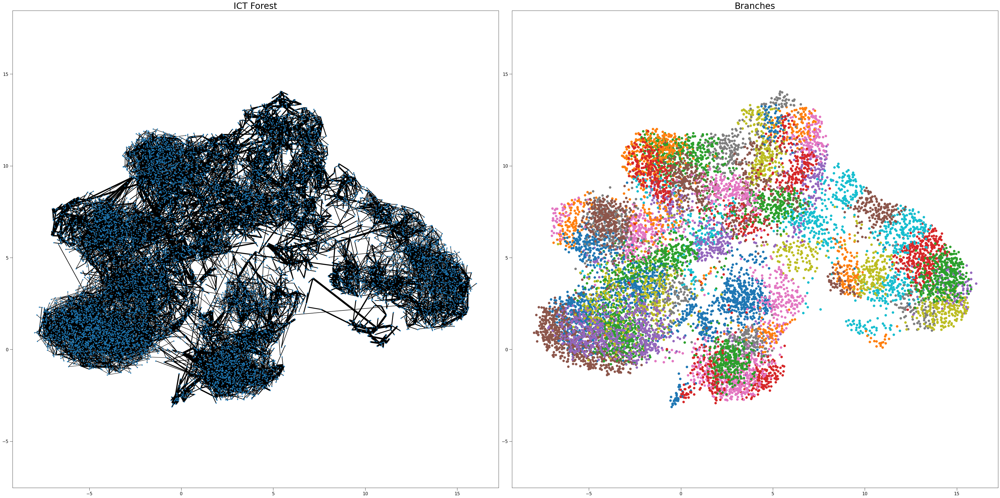

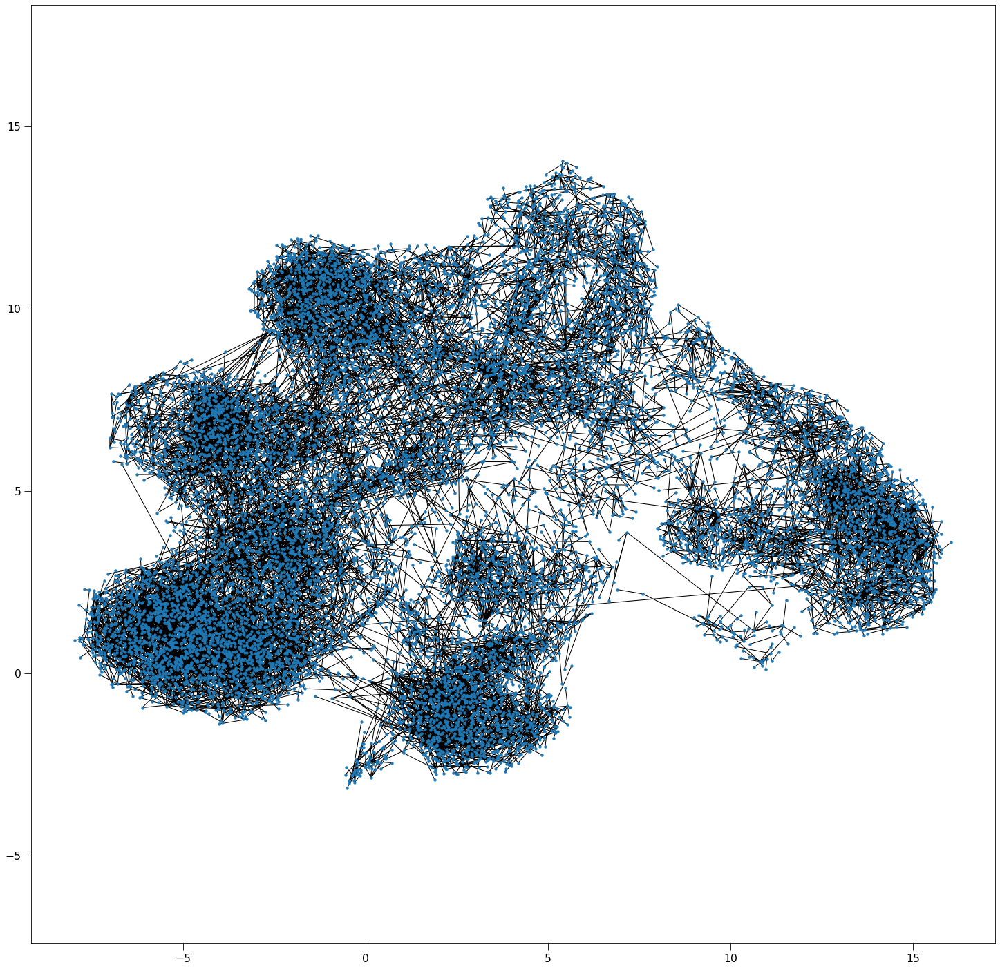

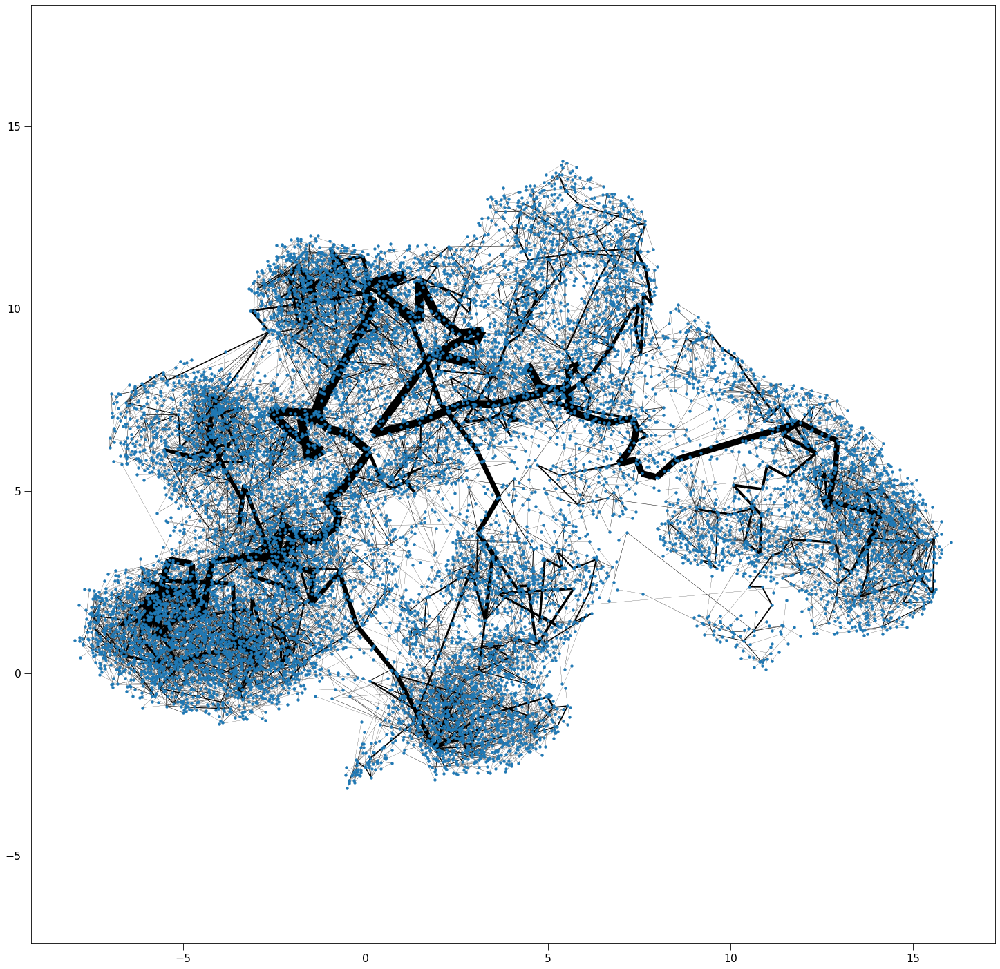

In [11]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

G = patch_together_nearest(G, pca)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [12]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT.indexEdges()

create edgeId array:   0%|          | 0/13644 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/13644 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13644 [00:00<?, ?it/s]

update Arr 13644 -> 13644
added 8916 edges early
added 4727 edges early


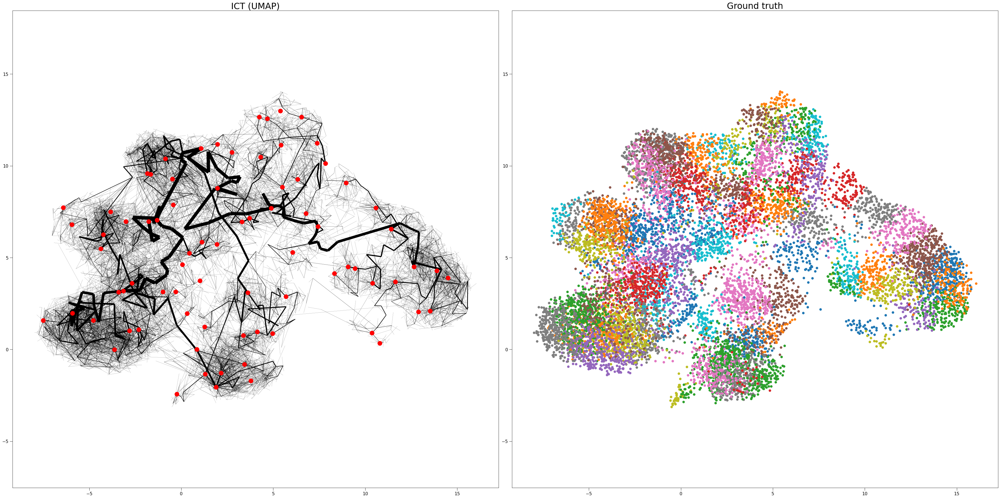

In [13]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

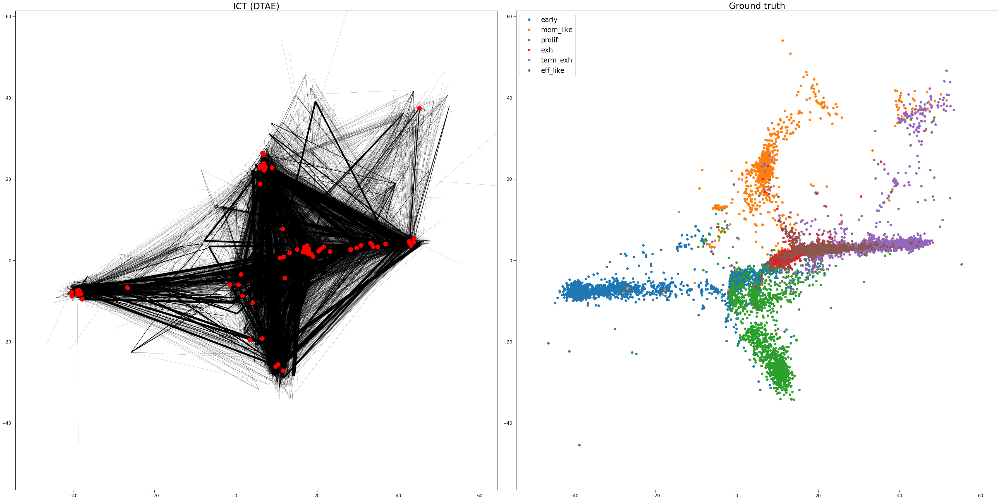

In [14]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

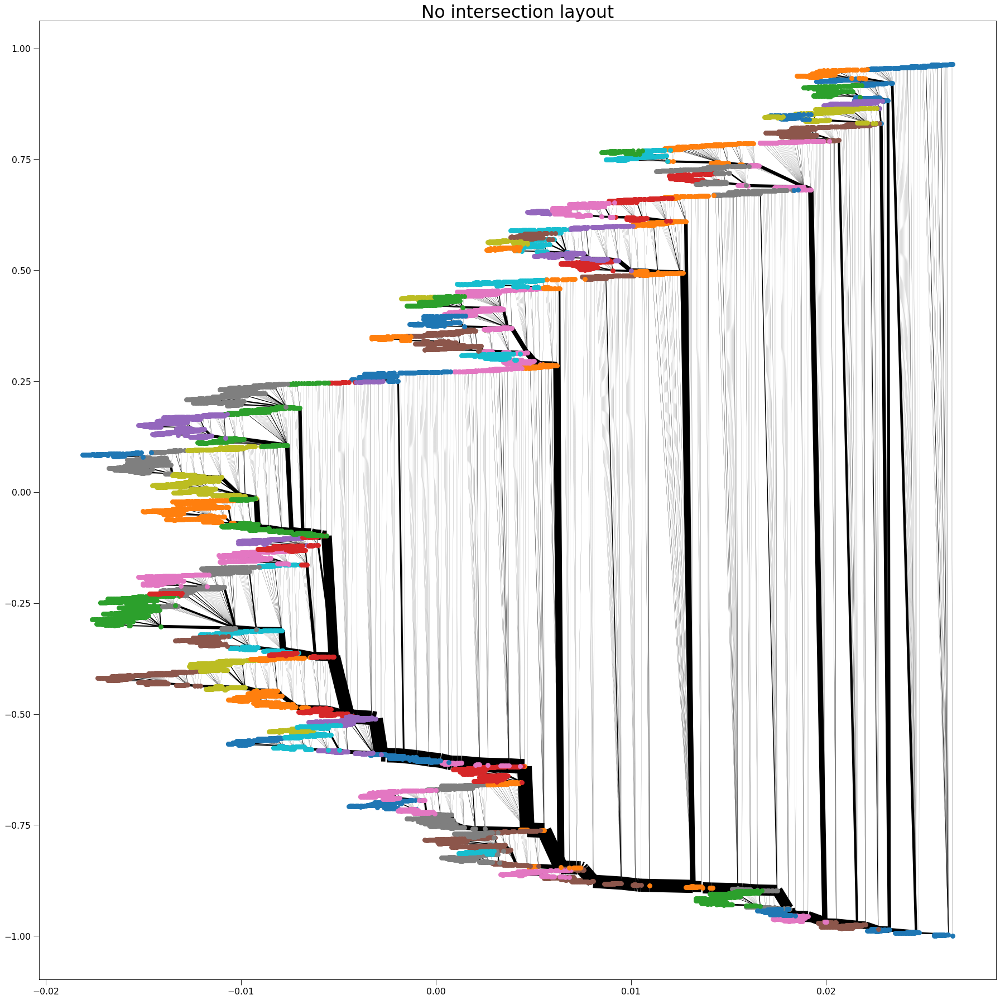

In [15]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()